<b><font size="5">Predicting the Difficulty and Enjoyment Rating of Backpacking Trails</font></b>

MyTrails is a backpacking AI that predicts the difficulty and enjoyment rating of hiking trails. To train the machine learning models, a list of ~3000 trails in USA National Parks is used, scraped from Alltrails.com. I include data from trails I've hiked myself as well, and I add a feature to keep track of which trails are mine to help fine-tune the model to my preferences. A historical weather API (Open_Meteo) is used to get climate data for each trail. I also use this project to visualize my personal backpacking statistics.

<b><font size="3">**Summary of Results:**</font></b>
- Difficulty Model Score: 0.65 to 0.75
- Rating Model Score: 0.2 to 0.3

Trail difficulty can be predicted sufficiently well using a trail's length, elevation gain, climate, location, and physical features. Enjoyment, however, is a different matter. Enjoyment is impacted greatly by trail condition, campsite quality, amount of bugs, and much more that isn't accounted for. It would be better to have a dataset of trail reviews linked to individual users, as opposed to the values I use currently that are averaged over many users. This would be better for building models that can learn user preferences. Also, if I had timestamps and locations for each user review, I could use the weather API to determine the precise weather experienced on each hike.

<b><font size="3">Imports and Defining Variables</font></b>

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import pickle
import requests
import calendar
import datetime as dt

# Plotting imports
import plotly.express as px
from matplotlib import pyplot as plt, ticker as mticker
from matplotlib.lines import Line2D
from matplotlib.dates import MonthLocator, YearLocator, DateFormatter
import matplotlib.colors as mcolors
from matplotlib.ticker import AutoMinorLocator
import matplotlib.patheffects as path_effects
from matplotlib.colors import Normalize
import matplotlib.cm as cm
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Machine learning imports
from sklearn.linear_model import Ridge, Lasso, RidgeCV
from sklearn.svm import SVR
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn import preprocessing
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import BaggingRegressor

In [2]:
### Defining Variables

# The user that the stats will be built for
masterUser = 'Jamie'

# Colours
backgroundColor = '#292929'
legendColor = 'w'
diffColors = np.array(['limegreen', 'yellow', 'darkorange', 'red'])
gainColors = np.array(['tab:blue', 'w', 'tab:red'])

# Font sizes
titleSize = 32
axisLabelSize = 26
tickLabelSize = 16
legendTextSize = 16

# Misc
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
standardCanvasHeight = 8
standardCanvasWidth = 16
DPI = 280 # dots per inch of plots 
dateFormat = '%Y-%m-%d' # move to top
myTrailsCSV = 'dataSources/MyTrails.csv'

<b><font size="3">Data Set Up</font></b>

In [3]:
"""
Predicts the number of days spent on a trail
Non-backpacking trails get 0 days, backpacking trails get at least 2 days
Long backpacking trails get more days for length
"""
def estimateNumberOfDays(trail):
    
    # Checking if the number of days already defined 
    if 'days' in trail.index and not pd.isna(trail.days):
        numDays = trail.days
    
    # Checking if it is not a backpacking trail
    elif trail.backpacking == 0:
        numDays = 1
        
    else:
        # Longer backpacking Trails are expected to take longer, based on my average distance/day
        numberOfDays = np.ceil(trail.distance/avgSoloDistPerDay)
        if numberOfDays > 1:
            numDays = numberOfDays
            
        # Backpacking trails must be at least 2 days
        else:
            numDays = 2
            
    return numDays

"""
Predicts the avg temp of a trail based on its climate
The avg of sin(x) from x=0 to x=pi is 2/pi, I assume only half the year is hikable, thus (2/pi)*(temp_range/2) = temp_range/pi
Returns the avg_annual_temp + temp_range/pi (since people tend to not hike in winter)
"""
def getAvgTempEstimate(trails):
    return (trails.summer_temp + trails.winter_temp).divide(2) + (trails.summer_temp - trails.winter_temp)/np.pi
    
# Importing MyTrails (referring to the dataset name, not necessarily trails I've hiked)
myTrails = pd.read_csv(myTrailsCSV, parse_dates=['start_date', 'end_date'], engine='python')
myTrailCols = myTrails.columns

# Adding columns and filling blanks
myAverageTempRange = (myTrails.max_temp - myTrails.min_temp).mean()
myTrailAvgTempEst = getAvgTempEstimate(myTrails)
myTrails['max_temp'] = myTrails.max_temp.fillna(myTrailAvgTempEst + myAverageTempRange/2)
myTrails['min_temp'] = myTrails.min_temp.fillna(myTrailAvgTempEst - myAverageTempRange/2)
myTrails['avg_temp'] = (myTrails.min_temp + myTrails.max_temp)/2
myTrails['backpacking'] = 1 # I only keep track of backpacking trails
myTrails['nights'] = (myTrails.end_date - myTrails.start_date).dt.days
myTrails['days'] = myTrails.nights + 1

# Hiking companion info
companionInstances = myTrails.query('user == @masterUser & status == 0').companions.dropna().str.split(', ').explode()
companions = sorted(companionInstances.unique())
for companion in companions:
    myTrails[companion] = myTrails.companions.fillna('').str.contains(companion).astype('int')
myTrails['solo'] = myTrails.num_people == 1

# Defining different subgroups of data
myCompletedTrails = myTrails.query('user == @masterUser & status == 0')
myGroupTrails = myCompletedTrails.query('num_people > 1')
mySoloTrails = myCompletedTrails.query('num_people == 1')

# Averages to be used later
avgCompletedDistance = myCompletedTrails.distance.sum()/myCompletedTrails.days.sum()
avgSoloDistPerDay = mySoloTrails.distance.sum()/mySoloTrails.days.sum()

# Cleaning and filling data
myTrails['days'] = myTrails.apply(lambda trail: estimateNumberOfDays(trail), axis=1)
myTrails['nights'] = myTrails.nights.fillna(myTrails.days - 1)
myTrails['rain'] = myTrails.rain.fillna(myTrails.annual_rain.multiply(myTrails.nights/365)) # avg rain over X 24 hr periods
myTrails['snow'] = myTrails.snow.fillna(0)
myTrails['order'] = myTrails.order.fillna(myTrails.query('user == @masterUser').order.max() + 1)
myTrails['user'] = myTrails.user.fillna(masterUser)
myTrails['num_people'] = myTrails.num_people.fillna(1)
myTrails['num_reviews'] = 1
myTrails['companions'] = myTrails.companions.fillna('')

# These are only used for the companion stats
myTrails['dist_per_day'] = myTrails.distance.divide(myTrails.days)
myTrails['gain_per_day'] = myTrails.elevation_gain.divide(myTrails.days)
myTrails['rain_per_night'] = myTrails.rain.divide(myTrails.nights)
myTrails['snow_per_night'] = myTrails.snow.divide(myTrails.nights)

In [4]:
# Importing USA National Park data
usaTrails = pd.read_csv('dataSources/AllTrailsUsaNationalParks.csv', engine='python', encoding='latin1')

# Adding/modifying columns
usaTrails['lat'] = usaTrails.apply(lambda trail: trail._geoloc.split(': ', 2)[1][:-7], axis=1)
usaTrails['lng'] = usaTrails.apply(lambda trail: trail._geoloc.split(': ', 2)[2][:-1], axis=1)
usaTrails['forest'] = usaTrails.features.str.contains('forest')
usaTrails['lake'] = usaTrails.features.str.contains('lake')
usaTrails['river'] = usaTrails.features.str.contains('river')
usaTrails['waterfall'] = usaTrails.features.str.contains('waterfall')
usaTrails['beach'] = usaTrails.features.str.contains('beach')
usaTrails['historic_site'] = usaTrails.features.str.contains('historic-site')
usaTrails['cave'] = usaTrails.features.str.contains('cave')
usaTrails['hot_spring'] = usaTrails.features.str.contains('hot-springs')
usaTrails['backpacking'] = usaTrails.activities.str.contains('backpacking')
usaTrails['country_name'] = 'USA'
usaTrails['user'] = 'Unknown'
usaTrails['route_source'] = 'alltrails'
usaTrails.loc[usaTrails['state_name'] == 'Maui', 'state_name'] = 'Hawaii' # Maui is part of Hawaii
usaTrails['length'] = usaTrails['length']/1000 # m to km
usaTrails['area_name'] = usaTrails['area_name'].str.replace(' National Park', '') # trimming park names
usaTrails['status'] = 0 # 0 represents completed
usaTrails['companions'] = '' # 0 represents completed
usaTrails['order'] = 1
usaTrails['num_people'] = 1 # overwhelming answer from a poll on reddit

# Renaming columns
usaTrails = usaTrails.rename(columns={'length': 'distance',
                                      'difficulty_rating':'difficulty',
                                      'avg_rating':'rating',
                                      'area_name':'park',
                                      'city_name':'region',
                                      'state_name':'province',
                                      'country_name':'country'})

# Adding weather/climate info
usaTrailAvgTemp = getAvgTempEstimate(usaTrails)
usaTrails['max_temp'] = usaTrailAvgTemp + myAverageTempRange/2
usaTrails['min_temp'] = usaTrailAvgTemp - myAverageTempRange/2
usaTrails['avg_temp'] = (usaTrails.max_temp + usaTrails.min_temp)/2
usaTrails['days'] = usaTrails.apply(lambda trail: estimateNumberOfDays(trail), axis=1)
usaTrails['nights'] = usaTrails.days - 1
usaTrails['rain'] = usaTrails['annual_rain'].multiply(usaTrails['nights']/365) # Avg rain over X 24 hr periods
usaTrails['snow'] = 0 # Assume nobody else is crazy enough to hike in winter

# Filtering out non-hiking points and outliers
noDriving = ~usaTrails.activities.str.contains('driving')
noPaddle = ~usaTrails.name.str.contains('Paddle')
usaTrails = usaTrails.query('@noDriving & @noPaddle & distance > 0.1 & num_reviews > 0 & elevation_gain > 1 & distance > 0.2')

# Removing unneeded columns
usaTrails = usaTrails.drop(['trail_id',
                            'popularity',
                            'visitor_usage',
                            'units',
                            '_geoloc',
                            'features',
                            'activities'], axis=1)

In [5]:
# Combining all the data
allOurTrails = pd.concat([usaTrails, myTrails])

# The columns used to estimate difficulty and rating, companion cols need to be added separately
xCols = ['distance', 'elevation_gain', 'park', 'region', 'province', 'country', 'lat', 'lng', 
         'days', 'max_temp', 'min_temp', 'rain', 'snow', 'summer_temp', 'winter_temp', 'annual_rain', 'annual_snow',
         'forest', 'lake', 'river', 'waterfall', 'beach', 'historic_site', 'cave', 'hot_spring', 'backpacking', 
         'user', 'order', 'num_people', 'num_reviews', 'route_type', 'route_source']

# Need this to normalize data before training and predicting later
numericTrainingData = allOurTrails[xCols].select_dtypes(include=[float, int])
numericTrainingDataMax = numericTrainingData.max()
numericTrainingDataMin = numericTrainingData.min()

# Defining different subgroups of data
ourTrails = allOurTrails.query('status == 0')
watchedTrails = allOurTrails.query('status == 1').copy()
myCompletedTrails = allOurTrails.query('user == @masterUser & status == 0')

<b><font size="3">Statistics</font></b>

In [6]:
### Quick Statistics

"""
Determines if there is a tie for a trail record
Constructs string for printing
"""
def tieValidator(recordTrails, fullLocation=True):
    recordNames = recordTrails.name.values
    
    if len(recordNames) == 1:
        if fullLocation == False:
            return recordNames[0]
        
        else:
            return f"{recordTrails.name.values[0]}, {recordTrails.park.values[0]}, " \
                   + f"{recordTrails.province.values[0]}, {recordTrails.country.values[0]}"
        
    else:
        if fullLocation == False:
            return f"{len(recordNames)} way tie"
        
        else:
            return f"{len(recordNames)} way tie, {recordTrails.park.values[0]}, " \
                   + f"{recordTrails.province.values[0]}, {recordTrails.country.values[0]}"

"""
Determines the min/max of a trail feature
FindMax = True -> Finds the max
FindMax = False -> find the min
PerColumn = perColumn -> determines the min/max PER perColumn (eg: distance PER day)
"""
def printTrailRecord(trails, recordName, column, units, findMax=True, perColumn=None, perColumnUnits=None):
    if perColumn == None:
        if findMax == True:
            recordCondition = trails[column] == trails[column].max()
            
        else:
            recordCondition = trails[column] == trails[column].min()
            
        recordTrails = trails.query('@recordCondition')
        return print(f"{recordName}: {round(recordTrails[column].values[0], 1)} {units} " 
                     + f"({tieValidator(recordTrails)})")
    
    else:
        if findMax == True:
            recordCondition = trails[column]/(trails[perColumn]) == (trails[column]/(trails[perColumn])).max()
            
        else:
            recordCondition = trails[column]/(trails[perColumn]) == (trails[column]/(trails[perColumn])).min()
            
        recordTrails = trails.query('@recordCondition')
        return print(f'{recordName}: {round(recordTrails[column].values[0]/(recordTrails[perColumn].values[0]))}'
                     + f' {units}/{perColumnUnits} ({tieValidator(recordTrails)})')

print("MY COMPLETED TRAIL STATISTICS")
print('\n')

print("TOTALS")
totalDist = myCompletedTrails.distance.sum()
print(f"Distance: {round(totalDist, 0)} km ({round(totalDist/40075, 3)} Earth circumnavigations, " 
      + f"{round(totalDist/42.195, 1)} marathons, {round(totalDist/0.4)} running track laps)")
totalGain = myCompletedTrails.elevation_gain.sum()
print(f"Elevation Gain: {round(totalGain/1000, 1)} km ({round(totalGain/(3480.816), 1)} Everests, {round(totalGain/346, 1)} "
      + f"CN Towers, {round(totalGain/1.8415)} Jamies)")
numCompletedTrails = len(myCompletedTrails)
print(f"Number of Trails: {numCompletedTrails}")
print(f"Number of Days: {round(myCompletedTrails.days.sum())}")
print(f"Number of Nights: {round(myCompletedTrails.nights.sum())}")
totalRain = myCompletedTrails.rain.sum()
print(f"Rain: {round(totalRain, 1)} mm ({round(totalRain/123, 1)} cans of pop)")
totalSnow = myCompletedTrails.snow.sum()
print(f"Snow: {round(totalSnow, 2)} cm ({round(totalSnow/12.3, 2)} cans of pop)")
print('\n')

print("RECORDS")
printTrailRecord(myCompletedTrails, 'Most Distance', 'distance', 'km')
printTrailRecord(myCompletedTrails, 'Most Elevation Gain', 'elevation_gain', 'm')
printTrailRecord(myCompletedTrails, 'Most Distance per Day', 'distance', 'km', 
                 perColumn='days', perColumnUnits='day')
printTrailRecord(myCompletedTrails, 'Most Elevation Gain per Day', 'elevation_gain', 'm', 
                 perColumn='days', perColumnUnits='day')
printTrailRecord(myCompletedTrails, 'Most Nights', 'nights', 'nights')
printTrailRecord(myCompletedTrails, 'Hottest Temperature', 'max_temp', '°C')
printTrailRecord(myCompletedTrails, 'Coldest Temperature', 'min_temp', '°C', findMax=False)
printTrailRecord(myCompletedTrails, 'Most Rain', 'rain', 'mm')
printTrailRecord(myCompletedTrails, 'Most Snow', 'snow', 'cm')

print(f"Most Common Park: {myCompletedTrails.park.mode()[0]} " 
      + f"({round(myCompletedTrails.park.value_counts()[0]/numCompletedTrails, 2)} of trails)")

mostCommonCompanions = companionInstances.mode()
print(f"Most Common Companion(s): {', '.join(mostCommonCompanions)} ({companionInstances.tolist().count(mostCommonCompanions[0])} trails)")
print('\n')

print("RATES")
print(f"Solo Rate: {round(len(mySoloTrails)/numCompletedTrails, 2)}")
print(f"Forest Rate: {round(myCompletedTrails.forest.mean(), 2)}")
print(f"Lake Rate: {round(myCompletedTrails.lake.mean(), 2)}")
print(f"River Rate: {round(myCompletedTrails.river.mean(), 2)}")
print(f"Waterfall Rate: {round(myCompletedTrails.waterfall.mean(), 2)}")
print(f"Beach Rate: {round(myCompletedTrails.beach.mean(), 2)}")
print(f"Historic Site Rate: {round(myCompletedTrails.historic_site.mean(), 2)}")
print(f"Cave Rate: {round(myCompletedTrails.cave.mean(), 2)}")
print(f"Hot Spring Rate: {round(myCompletedTrails.hot_spring.mean(), 2)}")
print('\n')

print("AVERAGES (BY TRAIL)")
print(f"Average Distance: {round(myCompletedTrails.distance.mean(), 1)} km")
print(f"Average Elevation Gain: {round(myCompletedTrails.elevation_gain.mean())} m")
print(f"Average Number of Days: {round(myCompletedTrails.days.mean(), 1)} days")
print('\n')

print("AVERAGES (BY DAY)")
print(f"Average Distance: {round(avgCompletedDistance, 1)} km " 
      + f"(Solo: {round(avgSoloDistPerDay, 1)} km, " 
      + f"Group: {round(myGroupTrails.distance.sum()/myGroupTrails.days.sum(), 1)} km)")
avgCompletedGain = myCompletedTrails.elevation_gain.sum()/myCompletedTrails.days.sum()
print(f"Average Elevation Gain: {round(avgCompletedGain)} m " 
      + f"(Solo: {round(mySoloTrails.elevation_gain.sum()/mySoloTrails.days.sum(), 1)} m, " 
      + f"Group: {round(myGroupTrails.elevation_gain.sum()/myGroupTrails.days.sum(), 1)} m)")
print('\n')

print('------------------------------------------------------------')
print('\n')

print("FULL DATASET STATISTICS")
print('\n')

print("TOTALS")
numTrails = len(ourTrails)
print(f"Number of Trails: {numTrails}")
print('\n')

print("RECORDS")
printTrailRecord(ourTrails, 'Longest Trail', 'distance', 'km')
printTrailRecord(ourTrails, 'Steepest Trail', 'elevation_gain', 'm', perColumn='distance', perColumnUnits='km')
printTrailRecord(ourTrails, 'Hottest Trail', 'summer_temp', '°C')
printTrailRecord(ourTrails, 'Coldest Trail', 'winter_temp', '°C', findMax=False)
printTrailRecord(ourTrails, 'Wettest Trail', 'annual_rain', 'mm/year')
printTrailRecord(ourTrails, 'Snowiest Trail', 'annual_snow', 'mm/year')
printTrailRecord(ourTrails, 'Driest Trail', 'annual_rain', 'mm/year', findMax=False)
printTrailRecord(ourTrails, 'Trendiest Trail', 'num_reviews', 'reviews')
stateWithMostTrails = ourTrails.province.mode()[0]
print(f"State with Most Trails: {stateWithMostTrails} "
      + f"({round(len(ourTrails[ourTrails.province == stateWithMostTrails])/numTrails, 3)} of trails)")
print('\n')

print("RATES")
print(f"Backpacking Trail Rate: {round(ourTrails.backpacking.mean(), 2)}")
print(f"{masterUser} Trail Rate: {round(len(ourTrails[ourTrails.user == masterUser])/len(ourTrails), 3)}")
print('\n')

print("AVERAGES (BY TRAIL)")
print(f"Average Distance: {round(ourTrails.distance.mean(), 1)} km")
print(f"Average Elevation Gain: {round(ourTrails.elevation_gain.mean())} m")

MY COMPLETED TRAIL STATISTICS


TOTALS
Distance: 927.0 km (0.023 Earth circumnavigations, 22.0 marathons, 2318 running track laps)
Elevation Gain: 18.2 km (5.2 Everests, 52.5 CN Towers, 9862 Jamies)
Number of Trails: 35
Number of Days: 91
Number of Nights: 56
Rain: 186.1 mm (1.5 cans of pop)
Snow: 28.4 cm (2.31 cans of pop)


RECORDS
Most Distance: 77.6 km (La Cloche Silhouette, Killarney, Ontario, Canada)
Most Elevation Gain: 1780.0 m (Kepler Track, Fiordland, NZ South Island, New Zealand)
Most Distance per Day: 18 km/day (Kepler Track, Fiordland, NZ South Island, New Zealand)
Most Elevation Gain per Day: 755 m/day (Grand Canyon, Grand Canyon, Arizona, USA)
Most Nights: 4.0 nights (La Cloche Silhouette, Killarney, Ontario, Canada)
Hottest Temperature: 27.7 °C (Slide Lake Loop, Frontenac, Ontario, Canada)
Coldest Temperature: -15.2 °C (Mizzy Lake, Algonquin, Ontario, Canada)
Most Rain: 27.9 mm (Grand Canyon, Grand Canyon, Arizona, USA)
Most Snow: 24.6 cm (Johns Brook Lodge, High Peaks,

In [7]:
### Summarizing stats for a specific hiking companion

"""
Prints a person's record (max or min) in a given feature
"""
def printPersonStat(prefix, units, recordFeature, person, personStats, rankMethod='min', rankAsc=False):    
    hikingCompanionsCopy = hikingCompanions.copy()
    hikingCompanionsCopy['recordRank'] = (hikingCompanionsCopy[recordFeature]
                                          .rank(method=rankMethod, ascending=rankAsc)
                                          .astype(int))
    personRank = hikingCompanionsCopy.query('name == @person').recordRank.values[0]
    numPeopleWithRank = hikingCompanionsCopy.recordRank.value_counts()[personRank]
    
    tieMsg = ''
    if numPeopleWithRank > 1:
        tieMsg = f' [{numPeopleWithRank} way tie]'
        
    if units != '':
        units = ' ' + units
        
    print(f'{prefix}: {personStats[recordFeature].values[0]}{units} (Rank: {personRank}/{numHikingCompanions}{tieMsg})')

"""
Prints a summary of my stats while hiking with this person
"""
def personBackpackingSummary(person):
    print(f"{person}'s backpacking summary".upper())
    print(f"with comparisons to {masterUser}'s other hiking companions (there are {numHikingCompanions})")
    print('\n')
    
    personStats = hikingCompanions.query('name == @person')

    printPersonStat('Number of Trails', '', 'num_trails', person, personStats)
    printPersonStat('Number of Days', '', 'num_days', person, personStats)
    printPersonStat('Number of Nights', '', 'num_nights', person, personStats)
    printPersonStat(f"Correlation with {masterUser}'s Enjoyment", '', 'rating_corr', person, personStats)
    print('\n')
    
    printPersonStat('Total Distance', 'km', 'distance', person, personStats)
    printPersonStat('Total Elevation Gain', 'm', 'elevation_gain', person, personStats)
    printPersonStat('Distance per Day', 'km/day', 'dist_per_day', person, personStats)
    printPersonStat('Elevation Gain per Day', 'm/day', 'gain_per_day', person, personStats)
    print(f'Longest Trail: {personStats.longest_hike.values[0]} ({personStats.longest_hike_dist.values[0]} km)')
    print('\n')

    printPersonStat('Hottest Tempurature', '°C', 'max_temp', person, personStats)
    printPersonStat('Coldest Tempurature', '°C', 'min_temp', person, personStats, rankAsc=True)
    printPersonStat('Total Rain', 'mm', 'rain', person, personStats)
    printPersonStat('Rain per 24h', 'mm/24h', 'rain_per_night', person, personStats)
    if personStats['snow'].values[0] > 0:
        printPersonStat('Total Snow', 'cm', 'snow', person, personStats)
        printPersonStat('Snow per 24h', 'cm/24h', 'snow_per_night', person, personStats)

hikingCompanions = pd.DataFrame(columns=['name', 'num_trails', 'num_parks', 'num_days', 'num_nights', 
                                         'distance', 'elevation_gain', 'longest_hike', 'longest_hike_dist', 
                                         'max_temp', 'min_temp', 'avg_temp', 'rain', 'snow', 'rating_corr'])

"""
Populating new hikingCompanions dataframe
One row for each person that has joined me on a backpacking trip
TODO: Use companions.apply() instead of enumerate(companions)
"""
for i, person in enumerate(companions):
    personTrailCondition = myCompletedTrails[person] == 1
    personTrails = myCompletedTrails.query('@personTrailCondition')
    longestTrails = personTrails.query('distance == @personTrails.distance.max()')
    enjoymentCorr = myCompletedTrails[person].corr(myCompletedTrails.rating)
    
    if np.isnan(enjoymentCorr):
        enjoymentCorr = 1
    else:
        enjoymentCorr = myCompletedTrails[person].corr(myCompletedTrails.rating)
        
    hikingCompanions.loc[i] = ([person,
                                len(personTrails),
                                len(personTrails.park.unique()),
                                round(personTrails.days.sum()), 
                                round(personTrails.nights.sum()),
                                round(personTrails.distance.sum(), 1),
                                round(personTrails.elevation_gain.sum(), 1),
                                longestTrails.name.values[0],
                                longestTrails.distance.values[0],
                                personTrails.max_temp.max(),
                                personTrails.min_temp.min(),
                                (personTrails.max_temp.max() + personTrails.max_temp.min())/2,
                                personTrails.rain.sum(),
                                personTrails.snow.sum(),
                                enjoymentCorr])

hikingCompanions['dist_per_day'] = hikingCompanions.distance/hikingCompanions.num_days.astype(float).round()
hikingCompanions['gain_per_day'] = (hikingCompanions.elevation_gain/hikingCompanions.num_days).astype(float).round()
hikingCompanions['rain_per_night'] = hikingCompanions.rain/hikingCompanions.num_nights.astype(float).round()
hikingCompanions['snow_per_night'] = hikingCompanions.snow/hikingCompanions.num_nights.astype(float).round()
hikingCompanions = round(hikingCompanions, 2)
numHikingCompanions = len(hikingCompanions)

personBackpackingSummary('Linda')


LINDA'S BACKPACKING SUMMARY
with comparisons to Jamie's other hiking companions (there are 14)


Number of Trails: 3 (Rank: 1/14 [2 way tie])
Number of Days: 9 (Rank: 1/14)
Number of Nights: 6 (Rank: 1/14)
Correlation with Jamie's Enjoyment: -0.01 (Rank: 9/14)


Total Distance: 43.7 km (Rank: 6/14)
Total Elevation Gain: 350.0 m (Rank: 7/14)
Distance per Day: 4.86 km/day (Rank: 14/14)
Elevation Gain per Day: 39.0 m/day (Rank: 14/14)
Longest Trail: McCrae Lake (17.2 km)


Hottest Tempurature: 27.4 °C (Rank: 2/14)
Coldest Tempurature: 3.9 °C (Rank: 8/14)
Total Rain: 1.7 mm (Rank: 7/14)
Rain per 24h: 0.28 mm/24h (Rank: 7/14)


In [8]:
### Summarizing stats for a specific trail

"""
Prints a trail's record (max or min) in a given feature
"""
def printTrailStat(prefix, units, recordFeature, trailNumber, trailStats, rankMethod='min', rankAsc=False):
    myCompletedTrailsCopy = myCompletedTrails.copy()
    myCompletedTrailsCopy['recordRank'] = (myCompletedTrailsCopy[recordFeature]
                                .rank(method=rankMethod, ascending=rankAsc)
                                .astype(int))
    trailRank = myCompletedTrailsCopy.query('order == @trailNumber').recordRank.values[0]
    numTrailsWithRank = myCompletedTrailsCopy.recordRank.value_counts()[trailRank]
    
    tieMsg = ''
    if numTrailsWithRank > 1:
        tieMsg = f' [{numTrailsWithRank} way tie]'
        
    print(f'{prefix}: {round(trailStats[recordFeature].values[0], 1)} {units} (Rank: {trailRank}/{numCompletedTrails}{tieMsg})')

"""
Prints a summary of a trail by hike number
"""
def completedTrailSummary(idNum):
    print(f'TRAIL #{idNum} SUMMARY')
    print(f"with comparisons to {masterUser}'s other completed trails (there are {numCompletedTrails})")
    print('\n')
    
    trail = myCompletedTrails.query('order == @idNum')
    print(f'Name: {trail.name.values[0]}')
    print(f'Park: {trail.park.values[0]}')
    print(f'Region: {trail.region.values[0]}')
    print(f'Province: {trail.province.values[0]}')
    print(f'Country: {trail.country.values[0]}')
    print('\n')
    
    if trail.companions.isnull().all() or trail.companions.values[0] == '':
        trailCompanions = 'None'
    else:
        trailCompanions = trail.companions.values[0]
        
    print(f'Companions: {trailCompanions}')
    print(f'Difficulty: {round(trail.difficulty.values[0])}/7')
    print(f'Enjoyment: {round(trail.rating.values[0])}/5')
    print('\n')
    
    printTrailStat('Distance', 'km', 'distance', idNum, trail)
    printTrailStat('Elevation Gain', 'm', 'elevation_gain', idNum, trail)
    printTrailStat('Distance per Day', 'km/day', 'dist_per_day', idNum, trail)
    printTrailStat('Elevation Gain per Day', 'm/day', 'gain_per_day', idNum, trail)
    print('\n')
    
    printTrailStat('Hottest Tempurature', '°C', 'max_temp', idNum, trail)
    printTrailStat('Coldest Tempurature', '°C', 'min_temp', idNum, trail, rankAsc=True)
    printTrailStat('Total Rain', 'mm', 'rain', idNum, trail)
    printTrailStat('Rain per 24h', 'mm', 'rain_per_night', idNum, trail)
    if trail.min_temp.values[0] <= 0:
        printTrailStat('Total Snow', 'cm', 'snow', idNum, trail)
        printTrailStat('Snow per 24h', 'cm', 'snow_per_night', idNum, trail)

completedTrailSummary(35)

TRAIL #35 SUMMARY
with comparisons to Jamie's other completed trails (there are 35)


Name: McCrae Lake
Park: McCrae Lake
Region: Muskoka
Province: Ontario
Country: Canada


Companions: Linda
Difficulty: 1/7
Enjoyment: 4/5


Distance: 17.2 km (Rank: 25/35 [2 way tie])
Elevation Gain: 80.0 m (Rank: 35/35)
Distance per Day: 5.7 km/day (Rank: 29/35)
Elevation Gain per Day: 26.7 m/day (Rank: 35/35)


Hottest Tempurature: 14.4 °C (Rank: 24/35)
Coldest Tempurature: 3.9 °C (Rank: 10/35)
Total Rain: 0.0 mm (Rank: 25/35 [11 way tie])
Rain per 24h: 0.0 mm (Rank: 25/35 [11 way tie])


<b><font size="3">Data Visulaizations</font></b>

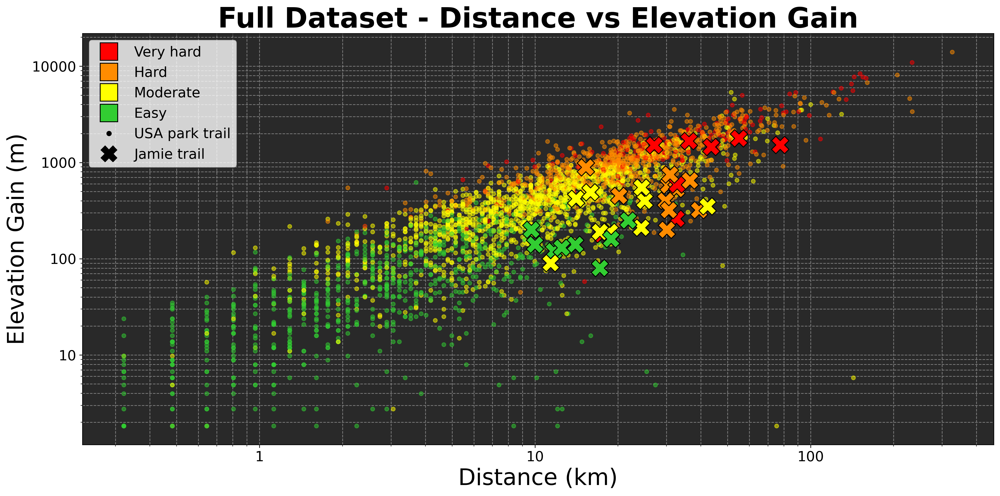

In [10]:
### Full Dataset - Distance vs Elevation Gain (with Difficulty, and Rating)

"""
Converts difficulty to its corresponding index in diffColors
"""
def difficultyColourIndex(trailDifficulty):
    return int((trailDifficulty - 1)/2)

usaDist = usaTrails.distance
usaGain = usaTrails.elevation_gain
usaDifficulty = usaTrails.apply(lambda trail: difficultyColourIndex(trail.difficulty), axis=1).copy()

myDist = myCompletedTrails.distance
myGain = myCompletedTrails.elevation_gain
myDifficulty = myCompletedTrails.apply(lambda trail: difficultyColourIndex(trail.difficulty), axis=1).copy()

# plotting
fig = plt.gcf()
ax = plt.gca()
title = "Full Dataset - Distance vs Elevation Gain"
ax.set_title(title, size=titleSize, fontweight='bold')
legend_elements = [
    Line2D([0], [0], marker='s', color='none', label="Very hard", markerfacecolor=diffColors[3], markersize=20),
    Line2D([0], [0], marker='s', color='none', label="Hard", markerfacecolor=diffColors[2], markersize=20),
    Line2D([0], [0], marker='s', color='none', label="Moderate", markerfacecolor=diffColors[1], markersize=20),
    Line2D([0], [0], marker='s', color='none', label="Easy", markerfacecolor=diffColors[0], markersize=20),
    Line2D([0], [0], marker='.', color='none', label="USA park trail", markerfacecolor='k', markersize=10),
    Line2D([0], [0], marker='X', color='none', label="Jamie trail", markerfacecolor='k', markersize=18)]
ax.legend(handles=legend_elements, facecolor=legendColor, prop={'size': legendTextSize})
plt.scatter(usaDist, usaGain, s=20, c=diffColors[usaDifficulty], marker='o', alpha=0.5, zorder=2)
plt.scatter(myDist, myGain, s=400, c=diffColors[myDifficulty], marker='X', edgecolors='k', zorder=3)
fig.set_size_inches(standardCanvasWidth, standardCanvasHeight)
plt.rcParams['axes.facecolor'] = backgroundColor
ax.set_xscale('log')
ax.set_yscale('log')
plt.xlabel("Distance (km)", size=axisLabelSize)
plt.ylabel("Elevation Gain (m)", size=axisLabelSize)
plt.grid(axis="both", which="both", ls='--', c='grey', zorder=0)
ax.tick_params(axis='both', which='both', labelsize=tickLabelSize)
ax.xaxis.set_major_formatter(mticker.FormatStrFormatter('%.0f'))
ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.0f'))
fig.set_dpi(DPI)
fig.patch.set_facecolor('w')
plt.tight_layout()
plt.savefig(f'images/{title.replace(" ", "")}')
plt.show()

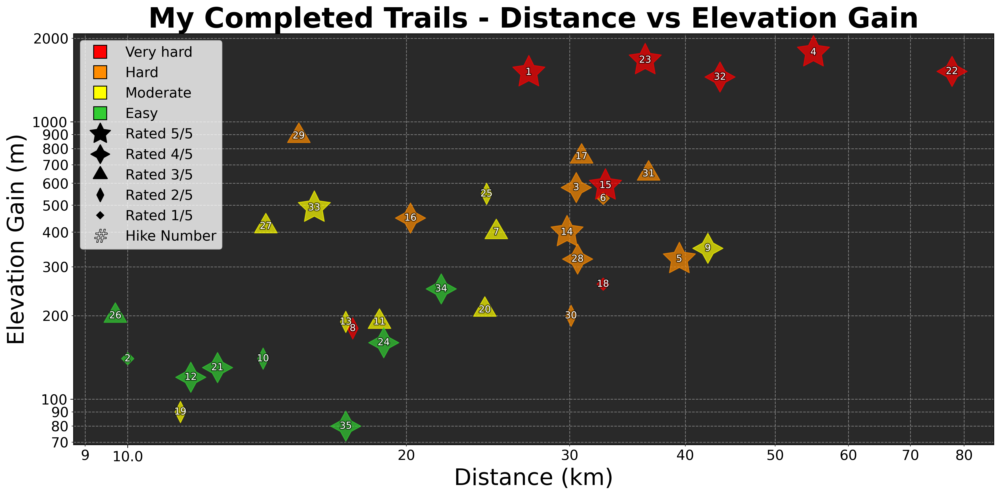

In [11]:
### My Completed Trails - Distance vs Elevation Gain (with Difficulty, and Rating)

"""
Generates a plot of Distance vs Elevation Gain (with Difficulty and Rating)
"""
def distGainPlot(title, 
                 xLabel, 
                 ylabel, 
                 dist, 
                 gain, 
                 rating, 
                 difficulty, 
                 annotations,
                 xLog=True, 
                 savePlot=False):
    
    fig = plt.gcf()
    ax = plt.gca()
    ax.set_title(title, size=titleSize, fontweight="bold")
    
    markers = ['D', (2,1,0), (3,1,0), (4,1,0), (5,1,0)]
    markerSizes = [100, 600, 900, 1200, 1500] 
    
    legend_elements = [
        Line2D([0], [0], marker='s', c='none', label="Very hard", markerfacecolor=diffColors[3], markersize=15),
        Line2D([0], [0], marker='s', c='none', label="Hard", markerfacecolor=diffColors[2], markersize=15),
        Line2D([0], [0], marker='s', c='none', label="Moderate", markerfacecolor=diffColors[1], markersize=15),
        Line2D([0], [0], marker='s', c='none', label="Easy", markerfacecolor=diffColors[0], markersize=15),
        Line2D([0], [0], marker=markers[4], c='none', label="Rated 5/5", markerfacecolor='k', markersize=25),
        Line2D([0], [0], marker=markers[3], c='none', label="Rated 4/5", markerfacecolor='k', markersize=22),
        Line2D([0], [0], marker=markers[2], c='none', label="Rated 3/5", markerfacecolor='k', markersize=19),
        Line2D([0], [0], marker=markers[1], c='none', label="Rated 2/5", markerfacecolor='k', markersize=16),
        Line2D([0], [0], marker=markers[0], c='none', label="Rated 1/5", markerfacecolor='k', markersize=6),
        Line2D([0], [0], marker='$\#$', c='none', label="Hike Number", markerfacecolor='w', markersize=16, mew=0.67)
    ]
    ax.legend(handles=legend_elements, facecolor=legendColor, prop={'size': legendTextSize})
   
    shadow_effect = [path_effects.withStroke(linewidth=2, foreground='black', alpha=0.6)]
    for _x, _y, _r, _c, _a in zip(dist, gain, rating, diffColors[difficulty], annotations):
        ratingIndex = int(round(_r)-1)
        plt.scatter(_x, _y, s=markerSizes[ratingIndex], c=_c, marker=markers[ratingIndex], alpha=0.7, zorder=2)
        annotation = ax.annotate(round(_a), (_x, _y), c='w', size=11, ha='center', va='center')
        annotation.set_path_effects(shadow_effect)
        
    fig.set_size_inches(standardCanvasWidth, standardCanvasHeight)
    plt.rcParams['axes.facecolor'] = backgroundColor
    fig.set_dpi(DPI)
    ax.set_yscale('log')
    if xLog == True:
        ax.set_xscale('log')
    plt.xlabel(xLabel, size=axisLabelSize)
    plt.ylabel(ylabel, size=axisLabelSize)
    plt.grid(axis='both', which='both', ls='--', c='grey', zorder=0)
    ax.tick_params(axis='both', which='both', labelsize=tickLabelSize)
    ax.xaxis.set_minor_formatter(mticker.ScalarFormatter())
    ax.xaxis.set_major_formatter(mticker.ScalarFormatter())
    ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.0f'))
    ax.yaxis.set_minor_formatter(mticker.FormatStrFormatter('%.0f'))
    fig.patch.set_facecolor('w')
    plt.tight_layout()
    
    if savePlot == True:
        plt.savefig(f'images/{title.replace(" ", "")}')
    plt.show()

# generating Distance vs Elevation Gain plot for my completed trails
distCompleted = myCompletedTrails.distance
gainCompleted = myCompletedTrails.elevation_gain
ratingCompleted = myCompletedTrails.rating
diffCompleted = myCompletedTrails.apply(lambda trail: difficultyColourIndex(trail.difficulty), axis=1)
hikeNumberCompleted = myCompletedTrails.order

distGainPlot('My Completed Trails - Distance vs Elevation Gain', 
             'Distance (km)',
             'Elevation Gain (m)',
             distCompleted, 
             gainCompleted, 
             ratingCompleted, 
             diffCompleted,
             hikeNumberCompleted,
             savePlot = True)

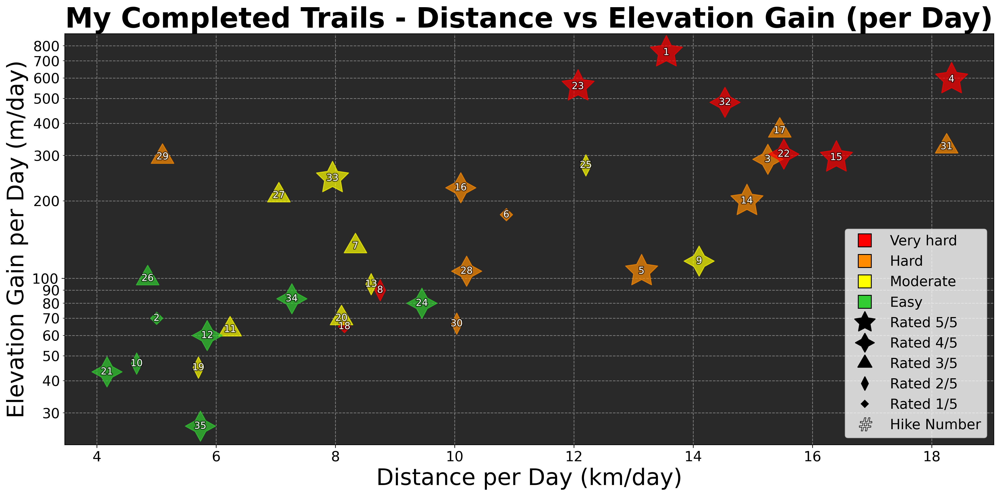

In [12]:
### My Completed Trails - Distance vs Elevation Gain Per Day (with Difficulty, and Rating)

distCompleted = myCompletedTrails.distance.divide(myCompletedTrails.days)
gainCompleted = myCompletedTrails.elevation_gain.divide(myCompletedTrails.days)

distGainPlot('My Completed Trails - Distance vs Elevation Gain (per Day)', 
             'Distance per Day (km/day)',
             'Elevation Gain per Day (m/day)',
             distCompleted, 
             gainCompleted, 
             ratingCompleted, 
             diffCompleted,
             hikeNumberCompleted,
             xLog = False,
             savePlot = True)

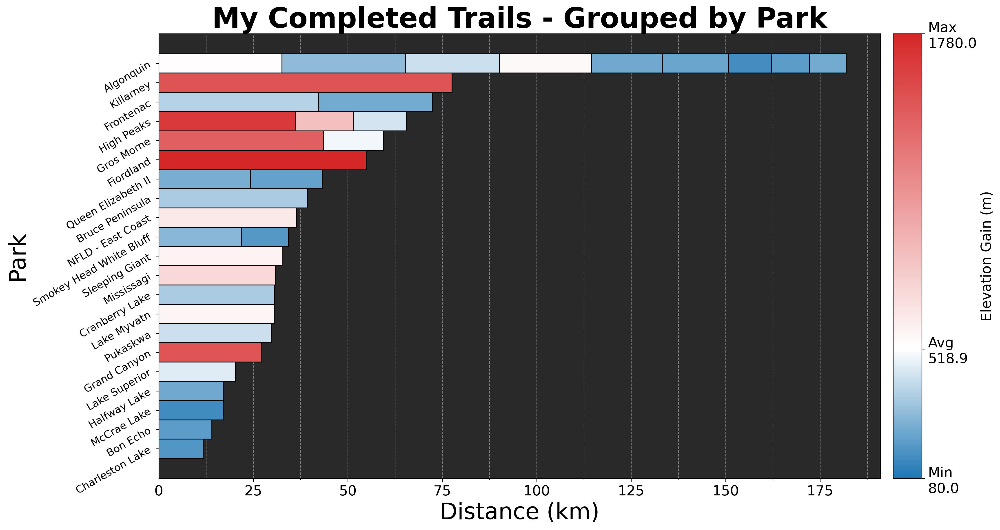

In [13]:
### My Completed Trails - Grouped by Park

"""
Determines which group to add the trail to and determines bar color
"""
def addTrailToBarStack(trail, barFeature, colorFeature, groups, groupBy, barValues, barColors):
    barStackIndex = groups.tolist().index(trail[groupBy])
    barStack = barValues[:, barStackIndex]
    
    # Fill the first empty slot
    for j, barValue in enumerate(barStack):
        if barValue == 0:
            barValues[j, barStackIndex] = trail[barFeature]
            barColors[j, barStackIndex] = trail[colorFeature]
            break


"""
No need for a space if there is no unit
"""
def setUnitSpace(hasSpace):
    if hasSpace == True:
        return " "
    else:
        return ""

"""
Produces an decendeing coloured bar chart, grouped by a specified feature (groupBy)
Bar height is determined by an inputed feature (barFeature)
Bar colour is determined by another inputed feature (colorFeature)
"""
def stackedBarPlot(plotTitle, 
                   xLabel,
                   trails,
                   barFeature,
                   colorRange = gainColors,
                   colorFeature = None, # defaults to barFeature
                   colorLabel = '',
                   groupBy = 'park',
                   barThickness = 0.4,
                   savePlot = False):
    
    if colorFeature == None:
        colorFeature = barFeature 

    groups = trails[[groupBy, barFeature]].groupby(groupBy).sum().sort_values(barFeature, ascending=True)
    groups = groups.reset_index()[groupBy]
    
    numBarsStacked = trails[groupBy].value_counts()[0]
    barValues = np.zeros((numBarsStacked, len(groups)))
    barColors = np.zeros((numBarsStacked, len(groups)))

    sortedTrails = trails[[groupBy, barFeature, colorFeature]].sort_values([groupBy, barFeature], 
                                                                           ascending=[True, False])
    
    sortedTrails.apply(lambda trail: addTrailToBarStack(trail, barFeature, colorFeature, 
                                                        groups, groupBy, barValues, barColors), axis=1)
            
    # Setting up bar colors
    cRangeMax = sortedTrails[colorFeature].max()
    cRangeMin = sortedTrails[colorFeature].min()
    cAvg = sortedTrails[colorFeature].mean()
    colorList = [(0.0, colorRange[0]), 
                 (cAvg/cRangeMax, colorRange[1]), 
                 (1.0, colorRange[2])]
    cmap = mcolors.LinearSegmentedColormap.from_list('', colorList)
    barColors /= cRangeMax # Normalizing

    fig = plt.gcf()
    ax = plt.gca()

    for i in range(barValues.shape[0]):
        ax.barh(groups, 
                barValues[i], 
                left = np.sum(barValues[:i], axis = 0), 
                color=cmap(barColors[i]),
                edgecolor='k',
                height=1,
                zorder=2)
    
    ax.yaxis.set_major_locator(mticker.FixedLocator(range(len(groups))))
    ax.set_yticklabels(groups, rotation = 30, ha='right')
    ax.tick_params(axis='x', which='both', labelsize=tickLabelSize)
    ax.tick_params(axis='y', which='both', labelsize=12)
    ax.set_title(plotTitle, size=titleSize, fontweight='bold')

    ax.xaxis.grid(True, which='minor')
    ax.xaxis.set_minor_locator(AutoMinorLocator(2))
    
    plt.grid(axis="x", which="both", ls='--', c='grey', zorder=0)
    plt.grid(axis="y", which="both", ls='none')
    plt.xlabel(xLabel, size=axisLabelSize)
    plt.ylabel(groupBy.capitalize(), size=axisLabelSize)
    fig.set_size_inches(standardCanvasWidth, 1.6 + len(groups)*barThickness)
    fig.set_dpi(DPI)
    fig.patch.set_facecolor('w')
    plt.rcParams['axes.facecolor'] = backgroundColor
    
    # Setting colorbar
    sm = cm.ScalarMappable(cmap=cmap)
    tick_locs = np.asarray(np.asarray(colorList)[:,0], dtype='float')
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='4%', pad=0.2)
    cbar = plt.colorbar(sm, orientation='vertical', ticks=tick_locs, cax=cax)
    cbar.set_label(colorLabel, size=tickLabelSize)
    cbar.ax.tick_params(labelsize=tickLabelSize)
    cbar.set_ticklabels([f'Min\n{round(cRangeMin, 1)}',
                         f'Avg\n{round(cAvg, 1)}',
                         f'Max\n{round(cRangeMax, 1)}'])
    plt.tight_layout()
    
    if savePlot == True:
        plt.savefig(f'images/{plotTitle.replace(" ", "")}', bbox_inches='tight')
    plt.show()

stackedBarPlot(plotTitle = 'My Completed Trails - Grouped by Park', 
               xLabel = 'Distance (km)',
               trails = myCompletedTrails,
               barFeature = 'distance',
               colorFeature = 'elevation_gain',
               colorRange = gainColors,
               colorLabel = 'Elevation Gain (m)',
               groupBy = 'park',
               barThickness = 0.33,
               savePlot = True)

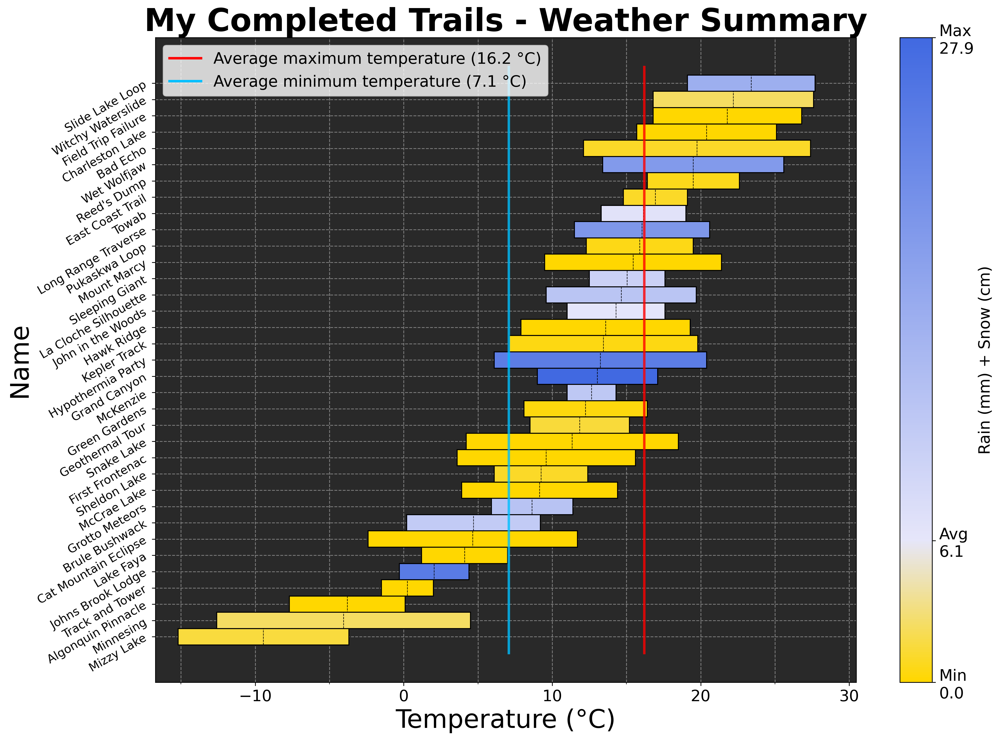

In [14]:
### My Completed Trails - Weather Summary

"""
Produces an decendeing coloured bar chart sorted by sortBy
Bar height is determined by barTop
barBottom determines the height of the bar bottom
Bar colour is determined by another inputed feature (colorCol)
"""
def colorBarPlot(plotTitle, 
                 xLabel, 
                 trails,
                 barUnits,
                 barTop,
                 barTopLabel,
                 colorRange,
                 barBottom = 0,
                 barBottomLabel = "",
                 barUnitSpace = True,
                 colorCol = None, # defaults to barTop
                 altColorCol = None,
                 colorLabel = "",
                 yTicks = 'name',
                 yTickLabel = 'name', 
                 xBounds = None, 
                 legendLocation = 'upper right',
                 sortBy = None, # defaults to barTop
                 barThickness = 0.3,
                 savePlot = False):
    
    if colorCol == None:
        colorCol = barTop
    
    if sortBy == None:
        sortBy = barTop
        
    BUS = setUnitSpace(barUnitSpace)

    avgTop = trails[barTop].mean()  
    numBarTrails = len(trails)
    
    fig = plt.gcf()
    ax = plt.gca()

    ax.set_title(plotTitle, size=titleSize, fontweight='bold')
    plt.xlabel(xLabel, size=axisLabelSize)
    plt.ylabel(f"{yTickLabel.capitalize()}", size=axisLabelSize)
    trails = trails.sort_values(by=[sortBy], ascending=True)
    ax.yaxis.set_major_locator(mticker.FixedLocator(range(len(trails[yTicks]))))
    ax.set_yticklabels(trails[yTickLabel], rotation=30, ha="right")
    fig.set_size_inches(standardCanvasWidth, 1.6 + len(trails)*barThickness)
    ax.xaxis.grid(True, which='minor')
    ax.xaxis.set_minor_locator(AutoMinorLocator(2))
    ax.tick_params(axis='y', which='major', labelsize=12)
    ax.tick_params(axis='x', which='both', labelsize=tickLabelSize)
    plt.rcParams['axes.facecolor'] = backgroundColor
    fig.set_dpi(DPI)
    
    # Bar bottom logic
    bottomIsInt = isinstance(barBottom, int)
    if bottomIsInt:
        barBottoms = [barBottom]*numBarTrails
        plt.grid(axis='x', which='both', ls='--', c='grey', zorder=0)
        plt.grid(axis='y', which='both', ls='none')
        topAvgColor = 'mediumpurple'
    else:
        barBottoms = trails[barBottom]
        plt.grid(axis='both', which='both', ls='--', c='grey', zorder=0)
        avgBottom = trails[barBottom].mean()  
        barBtmLabel=f'Average {barBottomLabel} ({round(avgBottom, 1)}{BUS + barUnits})' 
        topAvgColor='red'
        
    averagesLS = '-'
    averagesLW = 2.5
    bottomAvgColor = 'deepskyblue'
    barTopLabel = f'Average {barTopLabel} ({round(avgTop, 1)}{BUS + barUnits})'
    ax.plot([avgTop, avgTop], [-1, numBarTrails], topAvgColor, lw=averagesLW, ls=averagesLS, zorder=4, alpha=0.8)
    legend_elements = []
    legend_elements.append(Line2D([0], [0], color=topAvgColor, ls=averagesLS, lw=averagesLW, label=barTopLabel))
    if not bottomIsInt:
        ax.plot([avgBottom, avgBottom], [-1, numBarTrails], c=bottomAvgColor, 
                lw=averagesLW, ls=averagesLS, zorder=4, alpha=0.8)
        legend_elements.append(Line2D([0], [0], color=bottomAvgColor, ls=averagesLS, 
                                      lw=averagesLW, label=barBtmLabel))
    plt.legend(facecolor=legendColor, prop={'size': legendTextSize}, handles=legend_elements, loc=legendLocation)

    barTops = trails[barTop] - barBottoms
    if xBounds == None:
        plt.xlim(np.min(barBottoms)*1.1, np.max(trails[barTop])*1.1)
    else:
        plt.xlim(xBounds[0], xBounds[1])

    # Setting up colour map
    if altColorCol != None:
        colorValues = pd.Series([x+y for x, y in zip(trails[altColorCol], trails[colorCol])])
    else:
        colorValues = trails[colorCol]
        
    cRangeMin = colorValues.min()
    cRangeMax = colorValues.max()
    cAvg = colorValues.mean()
    colorList = [(0.0, colorRange[0]), 
                 ((cAvg-cRangeMin)/(cRangeMax-cRangeMin), colorRange[1]), 
                 (1.0, colorRange[2])]
    cmap = mcolors.LinearSegmentedColormap.from_list("", colorList)
    
    # Setting up colour bar
    sm = cm.ScalarMappable(cmap=cmap)
    tick_locs = np.asarray(np.asarray(colorList)[:,0], dtype='float')
    cbar = plt.colorbar(sm, orientation='vertical', ticks=tick_locs, ax=ax)
    cbar.set_label(colorLabel, size=tickLabelSize)
    cbar.ax.tick_params(labelsize=tickLabelSize)
    cbar.set_ticklabels([f'Min\n{round(cRangeMin, 1)}',
                         f'Avg\n{round(cAvg, 1)}',
                         f'Max\n{round(cRangeMax, 1)}'])
    
    plt.barh(trails[yTicks], 
            barTops,
            left=barBottoms,
            color=cmap(((colorValues-cRangeMin)/(cRangeMax-cRangeMin)).astype('float')), 
            height=1, 
            edgecolor='k',
            zorder=2)
    
    if sortBy != barTop:
        # Adding secondary lines at bar midpoints
        stepY = (np.array(range(numBarTrails))-0.5).tolist()
        stepY.append(stepY[-1] + 1)
        stepX = ((trails[barTop]+barBottoms)/2).tolist()
        stepX.append(stepX[-1])
        ax.step(stepX, stepY, c='k', where='pre', ls='--', lw=0.6, zorder=3)
    
    fig.patch.set_facecolor('w')
    
    if savePlot == True:
        plt.savefig(f'images/{plotTitle.replace(" ", "")}', bbox_inches='tight')
    plt.show()
    
colorBarPlot(plotTitle = "My Completed Trails - Weather Summary",
             xLabel = "Temperature (°C)",
             trails = myCompletedTrails,
             barUnits = "°C",
             barTop = "max_temp",
             barTopLabel = "maximum temperature",
             barBottom = "min_temp",
             barBottomLabel = "minimum temperature",
             colorRange = ['gold', 'lavender', 'royalblue'],
             colorCol = "rain",
             altColorCol = "snow",
             colorLabel = "Rain (mm) + Snow (cm)",
             legendLocation = "upper left",
             sortBy = "avg_temp",
             yTickLabel = "name",
             barThickness = 0.3,
             savePlot = True)

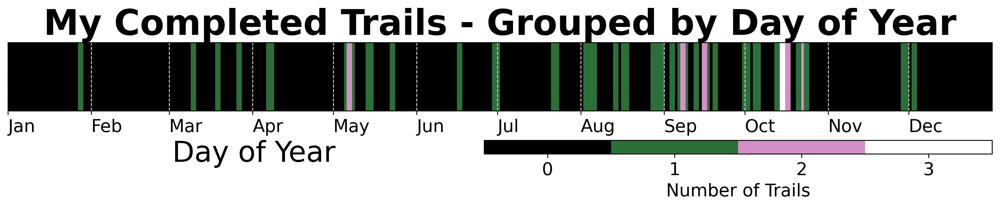

In [15]:
### My Completed Trails - Grouped by Day of Year 

"""
Adds a trail to counts (length 366), each element of counts represents a day of the year
"""
def addTrailToCounts(trail, counts):
    trailDateRange = pd.date_range(trail.start_date, trail.end_date, freq='d')
    
    for trailDate in trailDateRange:
        if calendar.isleap(trailDate.year)==False and trailDate.month>2:
            counts[trailDate.timetuple().tm_yday] += 1
            
        else:
            counts[trailDate.timetuple().tm_yday-1] += 1

trailCounts = np.zeros(366)
myCompletedTrails.apply(lambda trail: addTrailToCounts(trail, trailCounts), axis=1)
            
leapYear = dt.datetime(2020, 1, 1) # arbitrary leap year
periods = [leapYear + dt.timedelta(days=i) for i in range(366)]
cmap = plt.get_cmap('cubehelix', trailCounts.max() + 1)
        
fig = plt.figure(figsize=(standardCanvasWidth, standardCanvasHeight/7))
fig.set_dpi(DPI)
ax = plt.gca()   
ax.bar(periods, 1, align='edge', width=1, linewidth=0, color=cmap(trailCounts/trailCounts.max()), zorder=0)
ax.xaxis.set_major_locator(MonthLocator())
ax.xaxis.set_major_formatter(DateFormatter('%b'))
ax.set_xlim(periods[0], periods[-1] + dt.timedelta(hours=23))
for label in ax.xaxis.get_ticklabels():
    label.set_horizontalalignment('left')
ax.xaxis.set_tick_params(labelsize=tickLabelSize)
plt.grid(axis='x', which='both', ls='--', c='lightgrey', zorder=1)

title = 'My Completed Trails - Grouped by Day of Year'
ax.set_title(title, size=titleSize, fontweight='bold')
ax.set_xlabel('Day of Year', size=axisLabelSize, x=0.25)
plt.yticks([])
plt.ylim(0, 1)

# Setting up colour bar
sm = cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(0,max(trailCounts)))
n_clusters = max(trailCounts) + 1
tick_locs = (np.arange(n_clusters) + 0.5)*(n_clusters-1)/n_clusters
cbar = plt.colorbar(sm, orientation='horizontal', cax=fig.add_axes([0.5,-0.35,0.4,0.15]))
cbar.set_label('Number of Trails', size=tickLabelSize)
cbar.set_ticks(tick_locs)
cbar.ax.tick_params(labelsize=tickLabelSize)
cbar.set_ticklabels(range(int(n_clusters)))
cbar.outline.set_edgecolor('black')
cbar.outline.set_linewidth(0.8)

fig.patch.set_facecolor('w')
plt.savefig(f'images/{title.replace(" ", "")}', bbox_inches='tight')
plt.show()

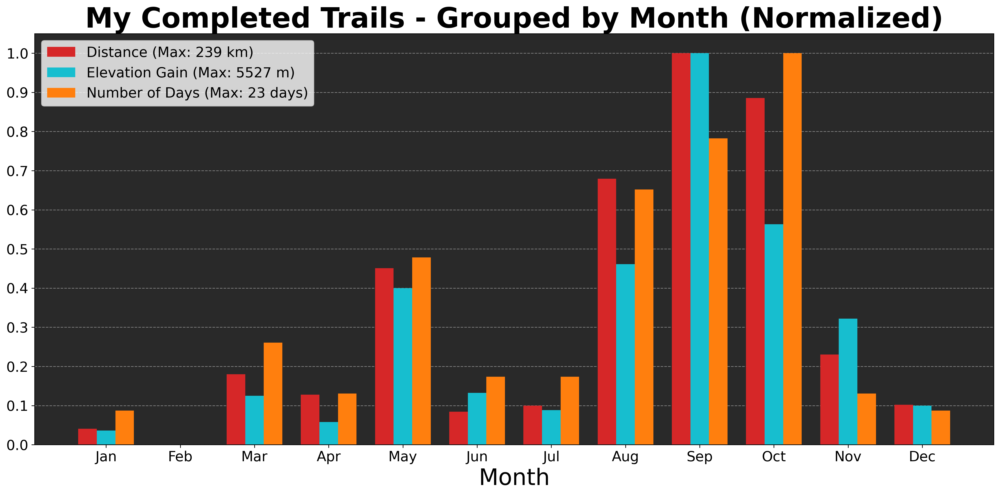

In [16]:
### My Completed Trails - Grouped by Month (Normalized)

"""
Adds a trail feature to a given month (in barValues)
Divides a trail feature evenly over each day if spread over multiple months
"""
def addTrailToMonth(trail, feature, barValues):
    trailDateRange = pd.date_range(trail.start_date, trail.end_date, freq='d')
    for trailDate in trailDateRange:
        barValues[trailDate.month-1] += trail[feature]/trail.days

"""
Generates a plot of hike data by month
"""
def summaryByMonthPlot(plotTitle, trails, legendLabels, units, features, colors):
    
    fig = plt.gcf()
    ax = plt.gca()
    periods = np.arange(12)
    barsPerMonth = len(features)
    barWidth = 1/(1 + barsPerMonth)

    for featureIndex, feature in enumerate(features):
        barValues = np.zeros(12)
        myCompletedTrails.apply(lambda trail: addTrailToMonth(trail, feature, barValues), axis=1)
                
        # Setting up bar position
        if featureIndex == 0:
            position = -(barsPerMonth-1)*barWidth/2
        else:
            position += barWidth
            
        ax.bar(periods+position, 
               barValues/barValues.max(), 
               width=barWidth, 
               linewidth=0, 
               color=colors[featureIndex],
               label=f"{legendLabels[featureIndex]} (Max: {round(barValues.max())} {units[featureIndex]})",
               zorder=2)

    fig.set_size_inches(standardCanvasWidth, standardCanvasHeight)
    fig.set_dpi(DPI)
    ax.tick_params(axis='both', which='both', labelsize=tickLabelSize)
    plt.grid(axis="y", which="both", ls='--', c='grey', zorder=0)
    plt.grid(axis="x", which="both", ls='none')
    plt.xticks(periods, months)
    plt.locator_params(axis='y', nbins=11)

    ax.set_title(plotTitle, size=titleSize, fontweight='bold')
    ax.set_xlabel("Month", size=axisLabelSize)
    plt.legend(facecolor=legendColor, prop={'size': legendTextSize})
    fig.patch.set_facecolor('w')
    plt.rcParams['axes.facecolor'] = backgroundColor
    plt.tight_layout()
    plt.savefig(f'images/{plotTitle.replace(" ", "")}')
    plt.show()

summaryByMonthPlot(plotTitle = "My Completed Trails - Grouped by Month (Normalized)", 
                   trails = myCompletedTrails,
                   features = ['distance', 'elevation_gain', 'days'],
                   colors = ['tab:red', 'tab:cyan', 'tab:orange'],
                   legendLabels = ['Distance', 'Elevation Gain', 'Number of Days'],
                   units = ['km', 'm', 'days'])

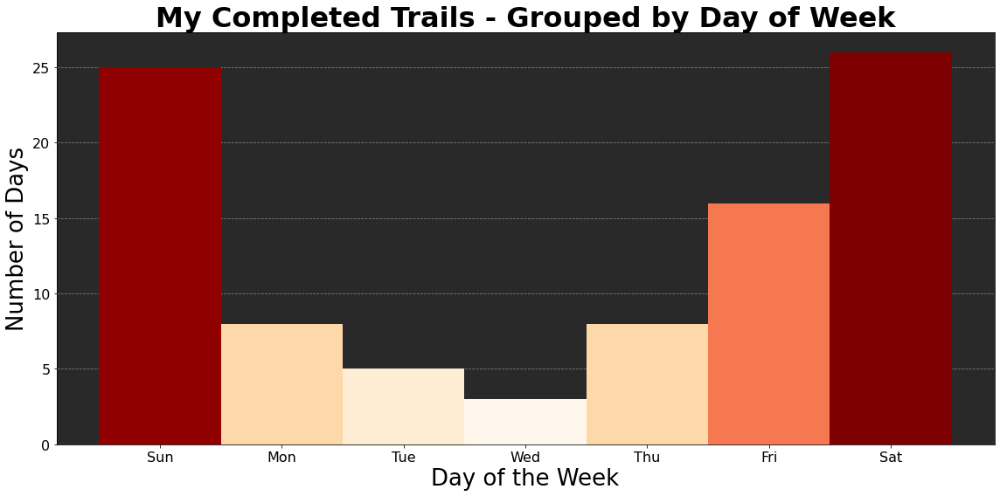

In [17]:
### My Completed Trails - Grouped by Day of Week

daysOccurrences = pd.concat([pd.Series(pd.date_range(start, end)) for start, end in zip(myCompletedTrails['start_date'], 
                                                                                   myCompletedTrails['end_date'])]).dt.day_name()

dayCounts = daysOccurrences.value_counts().reindex(pd.Series(['Sunday', 'Monday', 'Tuesday', 'Wednesday', 
                                                              'Thursday', 'Friday', 'Saturday']))
dayCounts = dayCounts.rename({'Sunday':'Sun', 'Monday':'Mon', 'Tuesday':'Tue', 'Wednesday':'Wed', 
                              'Thursday':'Thu', 'Friday':'Fri', 'Saturday':'Sat'})
norm = Normalize(vmin=dayCounts.min(), vmax=dayCounts.max())
cmap = cm.OrRd

ax.tick_params(axis='both', which='both', labelsize=tickLabelSize)
fig.set_dpi(DPI)

plt.figure(figsize=(standardCanvasWidth, standardCanvasHeight))
bars = plt.bar(dayCounts.index, dayCounts, color=cmap(norm(dayCounts)), width=1, zorder=2)
plt.title('My Completed Trails - Grouped by Day of Week', size=titleSize, fontweight='bold')
plt.xlabel('Day of the Week', size=axisLabelSize)
plt.ylabel('Number of Days', size=axisLabelSize)
plt.rcParams['axes.facecolor'] = backgroundColor
plt.xticks(size=tickLabelSize)
plt.yticks(size=tickLabelSize)
plt.grid(axis='y', which='both', ls='--', c='grey', zorder=0)
plt.grid(axis='x', which='both', ls='')
plt.tight_layout()
plt.show()

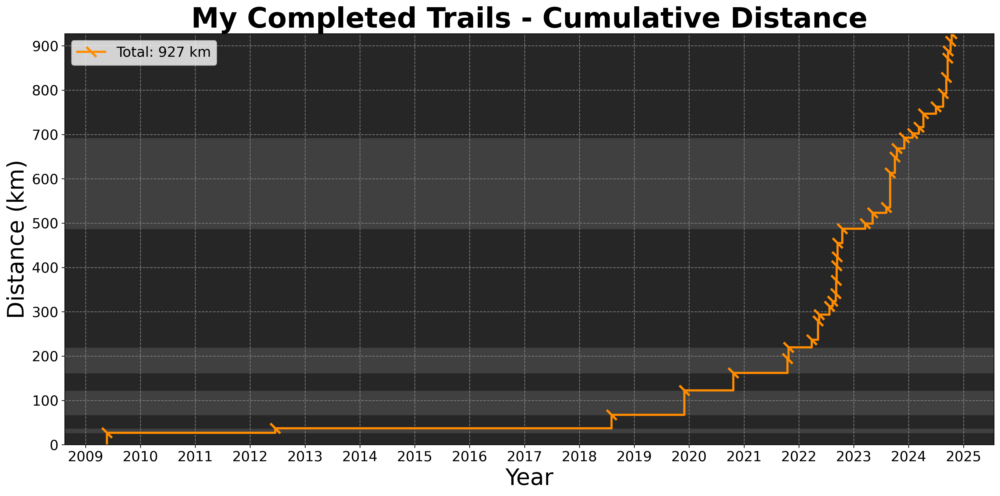

In [18]:
### My Completed Trails - Cumulative Distance
    
# Adding an extra datapoint for step plot appearance
distCum = pd.concat([pd.Series(0), myCompletedTrails.distance.cumsum()])
xDates = pd.concat([pd.Series(myCompletedTrails.end_date.iloc[0]), myCompletedTrails.end_date])

ax = plt.gca()
fig = plt.gcf()
title = "My Completed Trails - Cumulative Distance"
ax.set_title(title, size=titleSize, fontweight="bold")
plt.step(xDates, distCum, where="post", linewidth=2.5, markevery=(1, 1), marker=(2, 2, 45), markersize="16",
         mew=2.5, color='darkorange', label=f"Total: {round(myCompletedTrails.distance.sum())} km", zorder=2)

# Adding alternating colours on distance-axis for each calendar year
years = xDates.dt.year.array
distinctYears = []
calendarYearBarRollingValue = 0
for i, dist in enumerate(distCum.array): 
    if len(distinctYears)%2 == 0:
        color = '0.25'
    else:
        color = '0.15'
    
    if i == len(years)-1:
        ax.axhspan(calendarYearBarRollingValue, dist, facecolor=color, edgecolor=color, zorder=0)
    elif years[i+1] not in distinctYears:
        distinctYears.append(years[i+1])
        ax.axhspan(calendarYearBarRollingValue, dist, facecolor=color, edgecolor=color, zorder=0)
        calendarYearBarRollingValue = dist
        
plt.ylim(0, distCum.max())
fig.set_size_inches(standardCanvasWidth, standardCanvasHeight)
plt.grid(axis="both", which="both", ls='--', c='grey', zorder=1)
ax.tick_params(axis='both', which='both', labelsize=tickLabelSize)
fig.set_dpi(DPI)
plt.legend(facecolor=legendColor, prop={'size': legendTextSize}, loc=2)
plt.locator_params(axis='y', nbins=11)
plt.xlabel("Year", size=axisLabelSize)
plt.ylabel("Distance (km)", size=axisLabelSize)
ax.xaxis.set_major_locator(YearLocator())
ax.xaxis.set_major_formatter(DateFormatter('%Y'))
fig.patch.set_facecolor('w')
plt.tight_layout()
plt.savefig(f'images/{title.replace(" ", "")}')
plt.show()

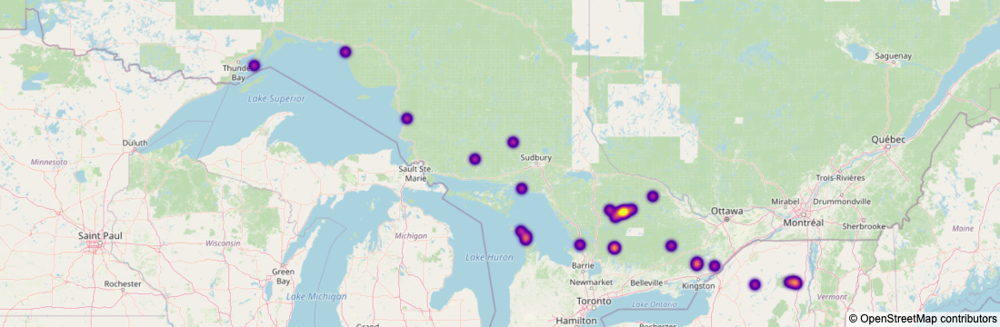

In [19]:
### Trail Locations on Map

fig = px.density_mapbox(myCompletedTrails, lat='lat', lon='lng', radius=10, center=dict(lat=46.5, lon=278), 
                        zoom=4.8, mapbox_style='open-street-map')

fig.update_layout(margin={'r':0,'t':0,'l':0,'b':0})
fig.update(layout_coloraxis_showscale=False)
fig.show()

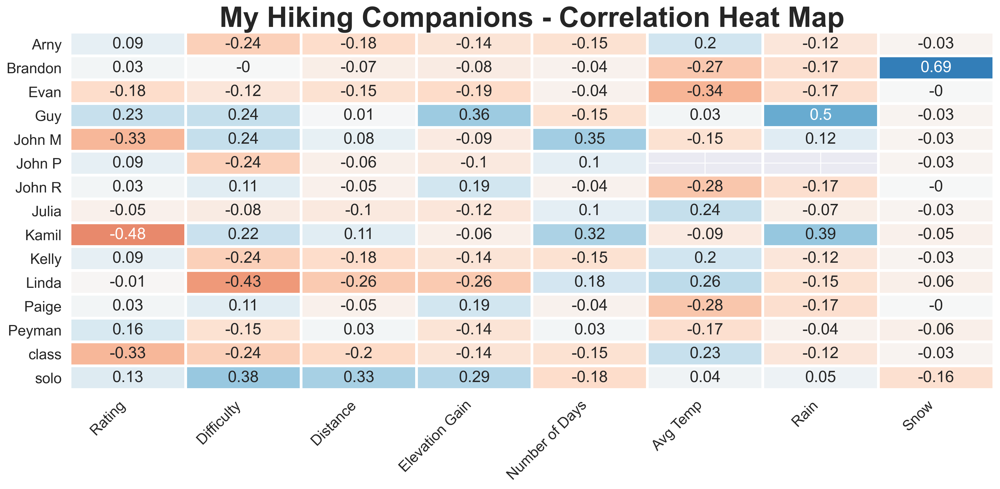

In [ ]:
### My Hiking Companions - Correlation Heat Map

"""
Generates correlation heat map for the given columns
"""
def corrHeatMap(titleStart, 
                trails, 
                xCols,
                yCols = [],
                xLabels = '',
                yLabels = ''):
    
    # Setting defaults
    if len(yCols) == 0:
        yCols = xCols
        
    if xLabels == '':
        xLabels = xCols
        
    if yLabels == '':
        if xCols != yCols:
            yLabels = yCols
            
        else:
            yLabels = xLabels
    
    if xCols != yCols:
        trails = trails[xCols + yCols]
        
    else:
        trails = trails[xCols]
        
    corr = trails.corr().round(2)
    
    if xCols != yCols:
        corr = corr.drop(yCols, axis=1)
        corr = corr.drop(xCols, axis=0)
        
    sns.set(rc={"figure.figsize":(standardCanvasWidth, standardCanvasHeight)})
    sns.set(font_scale = 1.5)
    heatmap = sns.heatmap(corr, annot=True, vmin=-1, vmax=1, center= 0, cmap="RdBu", linewidths=3, cbar=False)
    
    fig = plt.gcf()
    ax = plt.gca()
    
    fig.set_dpi(DPI)
    ax.set_xticklabels(xLabels, rotation = 45, ha='right')
    ax.set_yticklabels(yLabels)
    title = f"{titleStart} - Correlation Heat Map"
    ax.set_title(title, size=titleSize, fontweight='bold')
    fig.patch.set_facecolor('w')
    plt.tight_layout()
    plt.show()

corrHeatMap('My Hiking Companions', 
            myCompletedTrails, 
            ['rating', 'difficulty', 'distance', 'elevation_gain', 'days', 'avg_temp', 'rain', 'snow'],
            companions + ['solo'],
            ['Rating', 'Difficulty', 'Distance', 'Elevation Gain', 'Number of Days', 'Avg Temp', 'Rain', 'Snow'])

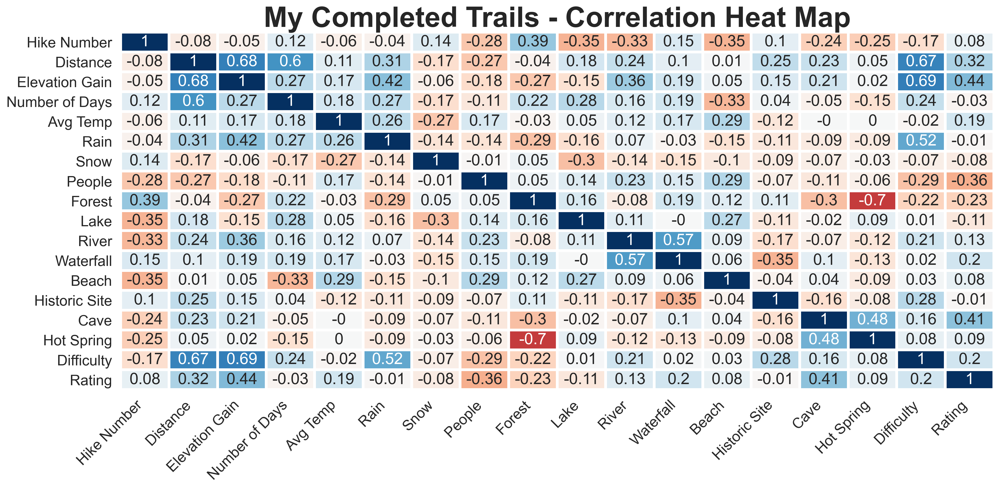

In [ ]:
### My Completed Trails - Correlation Heat Map

myHeatMapColumns = ['order','distance','elevation_gain','days','avg_temp','rain','snow', 'num_people', 'forest',
                    'lake','river','waterfall','beach','historic_site','cave','hot_spring','difficulty','rating']

myHeatMapLabels = ['Hike Number','Distance','Elevation Gain','Number of Days','Avg Temp','Rain','Snow', 'People','Forest',
                   'Lake','River','Waterfall','Beach','Historic Site','Cave','Hot Spring','Difficulty','Rating']

corrHeatMap('My Completed Trails', 
            myCompletedTrails, 
            myHeatMapColumns, 
            xLabels = myHeatMapLabels)

<b><font size="3">Generating Difficulty Model</font></b>


In [20]:
### Functions to make dataset usable for training

"""
Adds a prefix to a word, used to make values in a categorical column distinct from other columns
"""
def addPrefix(word, prefix):
    return f'{prefix}_{word}'

"""
Makes categorical columns distinct by applying column name as prefix
"""
def makeCategoriesUnique(trails):
    transformedTrails = trails.copy()
    
    transformedTrails['user'] = transformedTrails.user.apply(addPrefix, prefix='user')
    transformedTrails['route_source'] = transformedTrails.user.apply(addPrefix, prefix='route_source')
    transformedTrails['route_type'] = transformedTrails.user.apply(addPrefix, prefix='route_type')
    transformedTrails['park'] = transformedTrails.park.apply(addPrefix, prefix='park')
    transformedTrails['region'] = transformedTrails.region.apply(addPrefix, prefix='region')
    transformedTrails['province'] = transformedTrails.province.apply(addPrefix, prefix='province')
    transformedTrails['country'] = transformedTrails.country.apply(addPrefix, prefix='country')
    
    return transformedTrails

"""
If the input column is numeric, it will be normalized relative to the training dataset
"""
def normalizeNumericColumn(col):
    colName = col.name
    if colName in numericTrainingDataMin.index:
        maxValue = numericTrainingDataMax[colName]
        minValue = numericTrainingDataMin[colName]
        
        return (col - minValue)/(maxValue - minValue)
    
    else:
        return col

"""
Gives one hot transformed trails, optionally normalized
"""
def convertTrailsForModel(trails, normalize=True):
    transformedTrails = makeCategoriesUnique(trails)
    
    # Adding a column for each unique companion
    # Not using onehot for companions because it is a comma separated list
    for companion in companions:
        transformedTrails[companion] = transformedTrails.companions.str.contains(companion).astype('int') 
    
    transformedTrails = transformedTrails[xCols] # filtering columns
    
    if normalize:
        transformedTrails = transformedTrails.apply(normalizeNumericColumn)
                    
    transformedTrails = transformer.fit_transform(transformedTrails)     

    return transformedTrails

allOurTrailsOHE = makeCategoriesUnique(allOurTrails)

# Catagorical column encoding
one_hot = OneHotEncoder(handle_unknown='ignore',
                        categories=[allOurTrailsOHE.user.unique(),
                                    allOurTrailsOHE.route_source.unique(),
                                    allOurTrailsOHE.route_type.unique(),
                                    allOurTrailsOHE.park.unique(),
                                    allOurTrailsOHE.region.unique(),
                                    allOurTrailsOHE.province.unique(),
                                    allOurTrailsOHE.country.unique()])

transformer = ColumnTransformer([('one_hot', one_hot, ['user',
                                                       'route_source',
                                                       'route_type',
                                                       'park',
                                                       'region',
                                                       'province',
                                                       'country'])],
                                remainder='passthrough')

In [28]:
### Finding best difficulty estimator

"""
Returns the score for a given model
"""
def testEstimator(model, modelStr, XTrain, XTest, yTrain, yTest):
    model.fit(XTrain, yTrain)
    print(f'{modelStr}: {round(model.score(XTest, yTest), 3)}')

"""
Tests 8 different regressors to find the best one to cross validate
"""
def findBestEstimator(X_train, X_test, y_train, y_test, description, norm):
    NOT = ''
    if not norm:
        NOT = 'NOT '
        
    print(f'{description} MODEL SCORES (TRAINING DATA {NOT}NORMALIZED):'.upper())
    testEstimator(LinearRegression(), 'LinearRegression', X_train, X_test, y_train, y_test)
    testEstimator(Lasso(), 'Lasso', X_train, X_test, y_train, y_test)
    testEstimator(ElasticNet(), 'ElasticNet', X_train, X_test, y_train, y_test)
    testEstimator(Ridge(), 'Ridge', X_train, X_test, y_train, y_test)
    testEstimator(SVR(kernel='rbf'), 'SVR', X_train, X_test, y_train, y_test)
    testEstimator(RandomForestRegressor(), 'RandomForestRegressor', X_train, X_test, y_train, y_test)
    testEstimator(GradientBoostingRegressor(), 'GradientBoostingRegressor', X_train, X_test, y_train, y_test)
    testEstimator(BaggingRegressor(), 'BaggingRegressor', X_train, X_test, y_train, y_test)

"""
Tests 8 regressors using normalized values then using unchanged values
"""
def compareNormVsNotNorm(trainingTrails, trainingTrailsNorm, target, description):
    X_train, X_test, y_train, y_test = train_test_split(trainingTrails, target, test_size=0.2)
    findBestEstimator(X_train, X_test, y_train, y_test, description, norm=False)
    print('\n')
    X_trainNorm, X_testNorm, y_trainNorm, y_testNorm = train_test_split(trainingTrailsNorm, target, test_size=0.2)
    findBestEstimator(X_trainNorm, X_testNorm, y_trainNorm, y_testNorm, description, norm=True)
    
# Setting up data for training
y_difficulty = ourTrails.loc[:, 'difficulty']
y_rating = ourTrails.loc[:, 'rating']
ourTrailsForTraining = convertTrailsForModel(ourTrails, normalize = False)
ourTrailsForTrainingNorm = convertTrailsForModel(ourTrails, normalize = True)

# TODO: Is it actually better to not normalize? Does removing some features help?
compareNormVsNotNorm(ourTrailsForTraining, ourTrailsForTrainingNorm, y_difficulty, 'difficulty')

DIFFICULTY MODEL SCORES (TRAINING DATA NOT NORMALIZED):
LinearRegression: 0.447
Lasso: 0.211
ElasticNet: 0.21
Ridge: 0.231
SVR: 0.619
RandomForestRegressor: 0.613
GradientBoostingRegressor: 0.633
BaggingRegressor: 0.594


DIFFICULTY MODEL SCORES (TRAINING DATA NORMALIZED):
LinearRegression: 0.491
Lasso: -0.0
ElasticNet: -0.001
Ridge: 0.438
SVR: 0.009
RandomForestRegressor: 0.616
GradientBoostingRegressor: 0.635
BaggingRegressor: 0.587


In [177]:
### GradientBoostingRegressor without cross validation for difficulty

X_train_d, X_test_d, y_train_d, y_test_d = train_test_split(ourTrailsForTrainingNorm, y_difficulty, test_size=0.2)
testEstimator(GradientBoostingRegressor(), 'GradientBoostingRegressor', X_train_d, X_test_d, y_train_d, y_test_d)

GradientBoostingRegressor: 0.645


In [178]:
### GradientBoostingRegressor with cross validation for difficulty

cvGrid = {
    'n_estimators': [50, 100, 150],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5]}

# TODO: Do RandomForestRegressor too for good measure, for rating too
difficultyModel = GridSearchCV(GradientBoostingRegressor(), cvGrid, cv=5, refit=True, verbose=0)
difficultyModel.fit(X_train_d, y_train_d)
difficultyScore = round(difficultyModel.score(X_test_d, y_test_d), 3)

print(f'Difficulty Model Score: {difficultyScore}')

Difficulty Model Score: 0.654


In [27]:
### Saving best difficulty model

difficultyModelFileName = f'models/trailGenie_difficulty_{difficultyScore}.sav'
pickle.dump(difficultyModel, open(difficultyModelFileName, 'wb'))

<b><font size="3">Generating Rating Model</font></b>

In [30]:
### Finding best rating estimator

compareNormVsNotNorm(ourTrailsForTraining, ourTrailsForTrainingNorm, y_rating, 'rating')

RATING MODEL SCORES (TRAINING DATA NOT NORMALIZED):
LinearRegression: -4.019
Lasso: 0.095
ElasticNet: 0.095
Ridge: 0.208
SVR: 0.139
RandomForestRegressor: 0.262
GradientBoostingRegressor: 0.272
BaggingRegressor: 0.201


RATING MODEL SCORES (TRAINING DATA NORMALIZED):
LinearRegression: 0.156
Lasso: 0.003
ElasticNet: 0.014
Ridge: 0.199
SVR: -0.02
RandomForestRegressor: 0.215
GradientBoostingRegressor: 0.273
BaggingRegressor: 0.151


In [34]:
### GradientBoostingRegressor without cross validation for rating

X_train_r, X_test_r, y_train_r, y_test_r = train_test_split(ourTrailsForTrainingNorm, y_rating, test_size=0.2)
testEstimator(GradientBoostingRegressor(), 'GradientBoostingRegressor', X_train_r, X_test_r, y_train_r, y_test_r)

GradientBoostingRegressor: 0.284


In [35]:
### GradientBoostingRegressor with cross validation for rating

ratingModel = GridSearchCV(GradientBoostingRegressor(), cvGrid, cv=5, refit=True, verbose=0)
ratingModel.fit(X_train_r, y_train_r)
ratingScore = round(ratingModel.score(X_test_r, y_test_r), 3)

print(f'Rating Model Score: {ratingScore}')

Rating Model Score: 0.288


In [36]:
### Saving best rating model

ratingModelFileName = f'models/trailGenie_rating_{ratingScore}.sav'
pickle.dump(ratingModel, open(ratingModelFileName, 'wb'))

<b><font size="3">Making Predictions</font></b>

In [37]:
### Making difficulty predictions

def predictDifficulty(trails):
    difficultyModel = pickle.load(open('models/trailGenie_difficulty_0.655.sav', 'rb'))
    difficultyPredictions = difficultyModel.predict(trails)
    difficultyPredictions[difficultyPredictions > 7] = 7
    difficultyPredictions[difficultyPredictions < 1] = 1
    return difficultyPredictions

# setting up data for predictions
myWatchedTrailsForPrediction = convertTrailsForModel(watchedTrails)
watchedTrails['difficulty'] = predictDifficulty(myWatchedTrailsForPrediction)

In [38]:
### Making rating predictions

def predictEnjoyment(trails):
    ratingModel = pickle.load(open('models/trailGenie_rating_0.288.sav', 'rb'))
    ratingPredictions = ratingModel.predict(trails)
    ratingPredictions[ratingPredictions > 5] = 5
    ratingPredictions[ratingPredictions < 1] = 1
    return ratingPredictions

watchedTrails['rating'] = predictEnjoyment(myWatchedTrailsForPrediction)

In [49]:
### Saving prediction results

myTrails = pd.concat([myCompletedTrails, watchedTrails])[myTrailCols]

# saving
myTrails.to_csv(myTrailsCSV, index=False)

<b><font size="3">Plotting Difficulty and Rating Prediction Results</font></b>

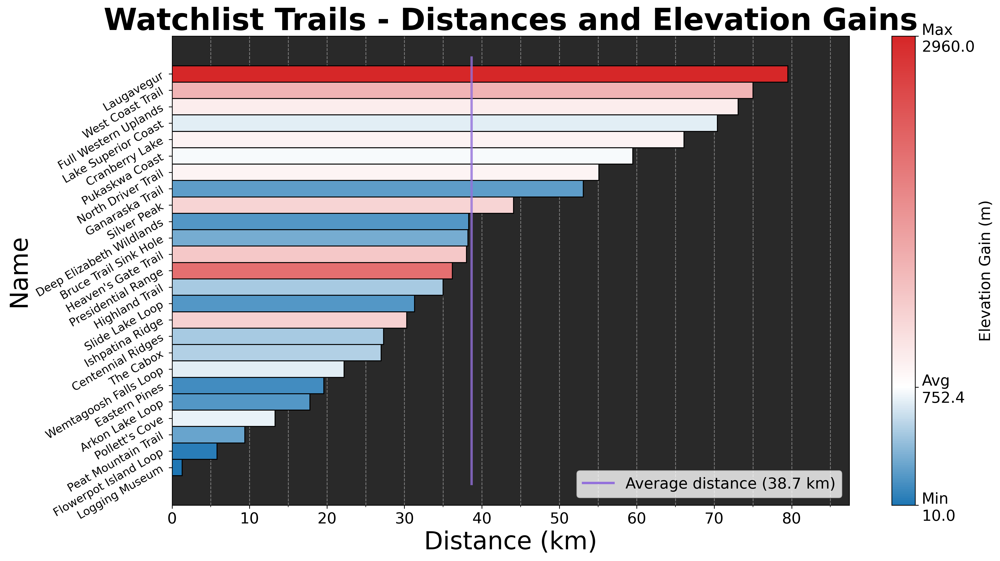

In [39]:
### Watchlist Trails - Distances

colorBarPlot(plotTitle = "Watchlist Trails - Distances and Elevation Gains",
             xLabel = "Distance (km)",
             trails = watchedTrails,
             barUnits = "km",
             barTop = "distance",
             barTopLabel = "distance",
             colorRange = gainColors,
             colorCol = "elevation_gain",
             legendLocation = "lower right",
             colorLabel = "Elevation Gain (m)",
             savePlot = True)

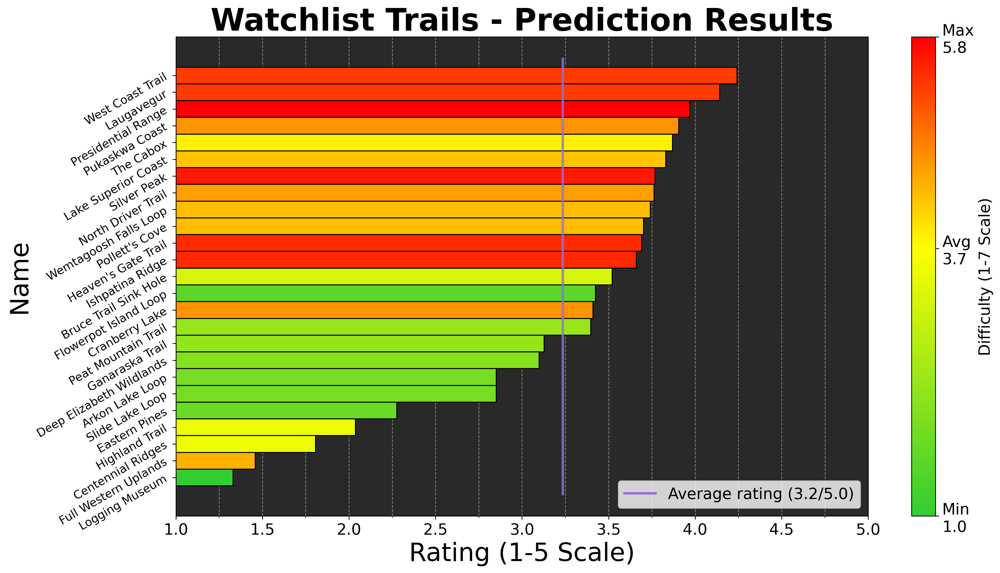

In [40]:
### Watchlist Trails - Predictions

colorBarPlot(plotTitle = "Watchlist Trails - Prediction Results",
             xLabel = "Rating (1-5 Scale)",
             trails = watchedTrails,
             barUnits = "/5.0",
             barUnitSpace = False,
             barTop = "rating",
             barTopLabel = "rating",
             colorRange = [diffColors[0], diffColors[1], diffColors[3]],
             colorCol = "difficulty",
             colorLabel = "Difficulty (1-7 Scale)",
             legendLocation = "lower right",
             xBounds = [1,5],
             savePlot = True)

In [53]:
### Refining prediction for a trail based on known dates and companions

"""
Gets the end date of a trail based on a start date and number of days
"""
def getEndDate(startDate, numDays):
    startDate = dt.datetime.strptime(startDate, dateFormat)
    endDate = startDate + dt.timedelta(days = numDays-1)
    return endDate.strftime(dateFormat)

"""
Printing the stats I want to compare while refining predictions
"""
def printStatsForRefinement(trail, numDays, startDate, hikingCompanions):
    
    trailForPrediction = convertTrailsForModel(trail)
    trail['difficulty'] = predictDifficulty(trailForPrediction)
    trail['rating'] = predictEnjoyment(trailForPrediction)
    
    if numDays != None:
        print(f'Num Days: {int(trail.days.values[0])}')
        
    if startDate != None:
        print(f'Max Temp: {round(trail.max_temp.values[0], 1)}°C')
        print(f'Min Temp: {round(trail.min_temp.values[0], 1)}°C')
        print(f'Rain: {round(trail.rain.values[0], 1)} mm')
        print(f'Snow: {round(trail.snow.values[0], 1)} cm')
        
    if hikingCompanions != None:
        print(f'Companions: {trail.companions.values[0]}')
        
    trailDifficulty = trail.difficulty.values[0]
    trailRating = trail.rating.values[0]
    print(f'Predicted Difficulty: {round(trailDifficulty, 2)}/7 ({round((trailDifficulty-1)/(7-1), 2)})')
    print(f'Predicted Rating: {round(trailRating, 2)}/5 ({round((trailRating-1)/(5-1), 2)})')
    print('\n')

"""
Refining Prediction for a trail based on known dates and companions
"""
def refinePrediction(trail, 
                     numDays = None, 
                     startDate = None, 
                     hikingCompanions = None):
    
    trail = trail.copy()
    
    print(f'Trail: {trail.name.values[0]}')
    print(f'Distance: {trail.distance.values[0]} km')
    print(f'Elevation Gain: {trail.elevation_gain.values[0]} m')
    print('\n')
    
    printStatsForRefinement(trail, numDays, startDate, hikingCompanions)
    
    if numDays != None:
        trail.days = numDays
        
        if numDays == 1:
            trail.backpacking = 0
        
        if startDate != None:
            trail.start_date = startDate
            trail.end_date = getEndDate(startDate, numDays)
            
            # Updating weather data
            endDate = dt.datetime.strptime(trail.end_date.values[0], dateFormat).date()
            startDate = dt.datetime.strptime(trail.start_date.values[0], dateFormat).date()
            currentDate = dt.datetime.now().date()
            maxForecastDate = currentDate + dt.timedelta(days=15)
            
            assert(startDate >= currentDate)
            
            if endDate <= maxForecastDate:
                forecastApiString = (f'https://api.open-meteo.com/v1/forecast?latitude={trail.lat.values[0]}&longitude={trail.lng.values[0]}'
                                    + '&hourly=temperature_2m,rain,showers,snowfall&timezone=auto&' 
                                    + f'start_date={trail.start_date.values[0]}&end_date={trail.end_date.values[0]}')

                forecastResponse = requests.get(forecastApiString)
                responseHourly = forecastResponse.json()['hourly']
                temps = responseHourly['temperature_2m'][12:-12]
                trail.max_temp = np.max(temps)
                trail.min_temp = np.min(temps)
                trail.rain = np.sum(responseHourly['rain'][12:-12]) + np.sum(responseHourly['showers'][12:-12])
                trail.snow = np.sum(responseHourly['snowfall'][12:-12])
                
            else:
                histMaxTemps = []
                histMinTemps = []
                histRains = []
                histSnows = []
                
                for i in range(10):
                    startDateOffset = (startDate.replace(year = currentDate.year - (i+1))).strftime(dateFormat)
                    endDateOffset = (endDate.replace(year = currentDate.year - (i+1))).strftime(dateFormat)                    
                    forecastApiString = (f'https://archive-api.open-meteo.com/v1/archive?latitude={trail.lat.values[0]}' 
                                         + f'&longitude={trail.lng.values[0]}&start_date={startDateOffset}&' 
                                         + f'end_date={endDateOffset}&hourly=temperature_2m,rain,snowfall')
                    
                    forecastResponse = requests.get(forecastApiString)   
                    responseHourly = forecastResponse.json()['hourly']
                    temps = responseHourly['temperature_2m'][12:-12]
                    histMaxTemps.append(np.max(temps))
                    histMinTemps.append(np.min(temps))
                    histRains.append(np.sum(responseHourly['rain'][12:-12]))
                    histSnows.append(np.sum(responseHourly['snowfall'][12:-12]))
                    
                trail.max_temp = np.mean(histMaxTemps)
                trail.min_temp = np.mean(histMinTemps)
                trail.rain = np.mean(histRains)
                trail.snow = np.mean(histSnows)

    # Updating companions
    if hikingCompanions != None:
        trail.companions = ', '.join(hikingCompanions)
        trail.num_people = len(hikingCompanions) + 1
        
        for companion in hikingCompanions:
            if companion in companions:
                trail[companion] = 1
    
    # Predicting with updated stats
    trailForPrediction = convertTrailsForModel(trail)
    trail['difficulty'] = predictDifficulty(trailForPrediction)
    trail['rating'] = predictEnjoyment(trailForPrediction)
    
    printStatsForRefinement(trail, numDays, startDate, hikingCompanions)

trailName = 'Logging Museum'
refinePrediction(
    trail = watchedTrails.query('name == @trailName'),
    numDays = 2,
    startDate = '2024-12-14',
    hikingCompanions = ['Peyman', 'Adrian']
)

Trail: Logging Museum
Distance: 1.3 km
Elevation Gain: 10.0 m


Num Days: 2
Max Temp: 23.9°C
Min Temp: 14.7°C
Rain: 1.9 mm
Snow: 0.0 cm
Companions: 
Predicted Difficulty: 1.0/7 (0.0)
Predicted Rating: 1.33/5 (0.08)


Num Days: 2
Max Temp: -0.9°C
Min Temp: -8.5°C
Rain: 1.8 mm
Snow: 1.7 cm
Companions: Kamil
Predicted Difficulty: 1.0/7 (0.0)
Predicted Rating: 1.8/5 (0.2)




In [170]:
# Add a function to just give predictions for an entirly custom trail
# You'll have to import the weather/climate functions